In [1]:
%matplotlib inline

from collections import namedtuple
import numpy as np
import matplotlib.pyplot as plt
from test_functions import test_functions  # модуль с тестовыми функциями

plt.rc('figure', dpi=300)

In [2]:
def plot_test_functions(method_wrapper, lstyle, first_batch=True):
    # инициализация графиков
    fig, axes = plt.subplots(nrows=5, ncols=2)
    fig.set_size_inches(8, 10)
    fig.subplots_adjust(hspace=0.5)
    axes = axes.flatten()
    
    # выбор первой или второй половины тестовых функций
    if first_batch:
        functions = test_functions[:10]
        first_number = 1
    else:
        functions = test_functions[10:]
        first_number = 11

    # поиск минимума и построение графика
    for i, tf in enumerate(functions):
        res = method_wrapper(tf)
        x = np.linspace(*tf.interval, 500)
        y = tf.f(x)
        ax = axes[i]
        ax.plot(x, y)
        ax.plot(res.x, res.y, **lstyle)
        title = '$f_{%d}(x)$, $x_{min}$ = %.3f, $n$ = %d' % (i + first_number, res.x_min, res.nfev)
        ax.set_title(title)

    return fig, axes

Вспомогательные функции и класс данных для хранения результатов минимизации.

In [3]:
OptimizeResult = namedtuple('OptimizeResult', ['x_min', 'x', 'y', 'nfev'])
MAXFEV = 3000  # максимальное число вызывов целевой функции

def argmax(iterable):
    """
    Возвращает индекс максимального элемента.
    """
    i_max = None
    x_max = None
    for i, x in enumerate(iterable):
        if x_max is None or x > x_max:
            x_max = x
            i_max = i
    return i_max


def argmin(iterable):
    """
    Возвращает индекс минимального элемента.
    """
    i_min = None
    x_min = None
    for i, x in enumerate(iterable):
        if x_min is None or x < x_min:
            x_min = x
            i_min = i
    return i_min

# Метод ломаных

In [4]:
def minimize_NA(f, a, b, L, atol=None, maxfev=MAXFEV, full_output=False):
    """
    Найти на на отрезке [`a`, `b`] минимум функции `f` с помощью метода
    ломаных (недифференцируемая целевая функция, априорно заданная оценка
    константы Липшица `L`).
    """
    def new_point(i):
        return (x[i] + x[i + 1]) / 2 - (y[i + 1] - y[i]) / (2 * L)

    def characteristic(i):
        return (y[i] + y[i + 1]) / 2 - L * (x[i + 1] - x[i]) / 2

    # точность по умолчанию
    if atol is None:
        atol = 1e-4 * (b - a)

    x = [a, b]               # точки разбиения интервала
    y = [f(a), f(b)]         # значения функции в этих точках
    x_m = [new_point(0)]     # точки внутри интервалов
    F = [characteristic(0)]  # характеристики интервалов

    while True:
        # найдём интервал с минимальной характеристикой
        i = argmin(F)

        # проверим условие остановки по точности
        if x[i + 1] - x[i] <= atol:
            break

        # проверяем условие остановки по числу итераций
        if len(y) > maxfev:  # слишком много итераций -- останавливаем расчёт
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # условие не выполнено => разбиваем интервал на 2 части
        x.insert(i + 1, x_m[i])
        y.insert(i + 1, f(x_m[i]))

        # меняем характеристику старого интервала на характеристики двух новых
        x_m[i] = new_point(i)
        x_m.insert(i + 1, new_point(i + 1))
        F[i] = characteristic(i)
        F.insert(i + 1, characteristic(i + 1))

    # возвращаем результат
    x_min = x[i] if y[i] < y[i + 1] else x[i + 1]
    if not full_output:
        return x_min
    x_full = []
    y_full = []
    for i in range(len(y) - 1):
        x_full.append(x[i])
        x_full.append(x_m[i])
        y_full.append(y[i])
        y_full.append(F[i])
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

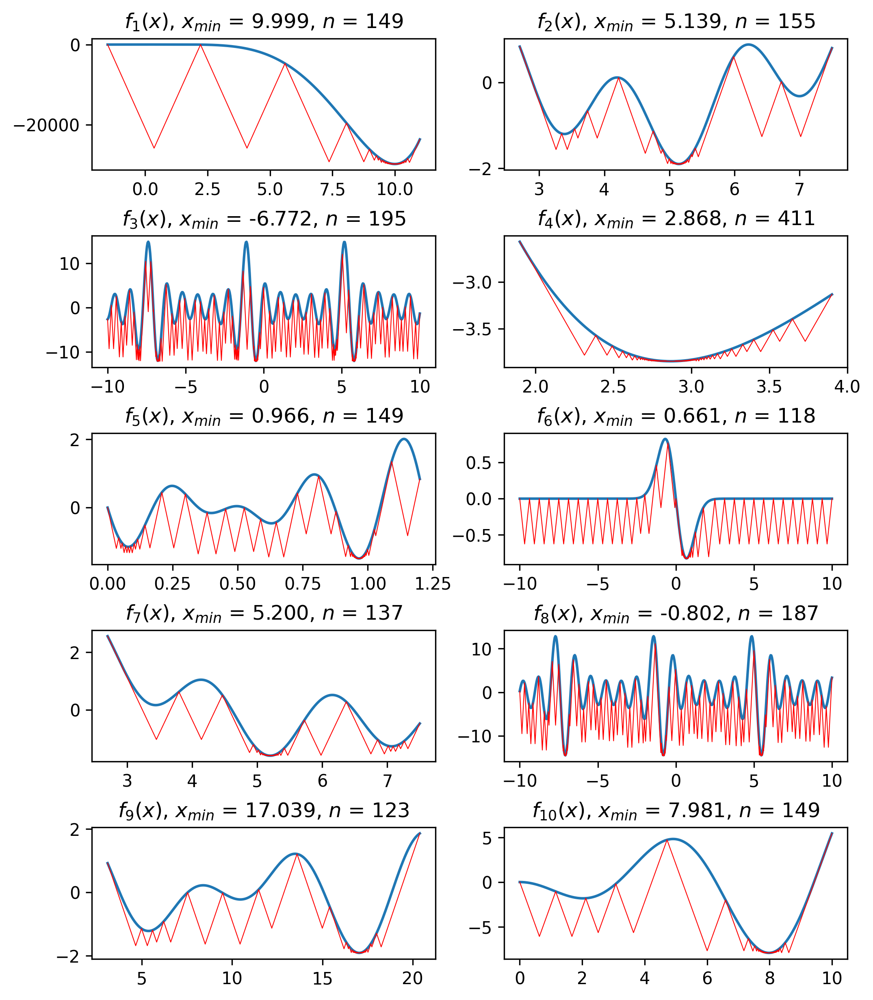

In [5]:
fig, _ = plot_test_functions(
    lambda tf: minimize_NA(f=tf.f, a=tf.interval[0], b=tf.interval[1], L=tf.L,
                           atol=1e-4*(tf.interval[1]-tf.interval[0]),
                           full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

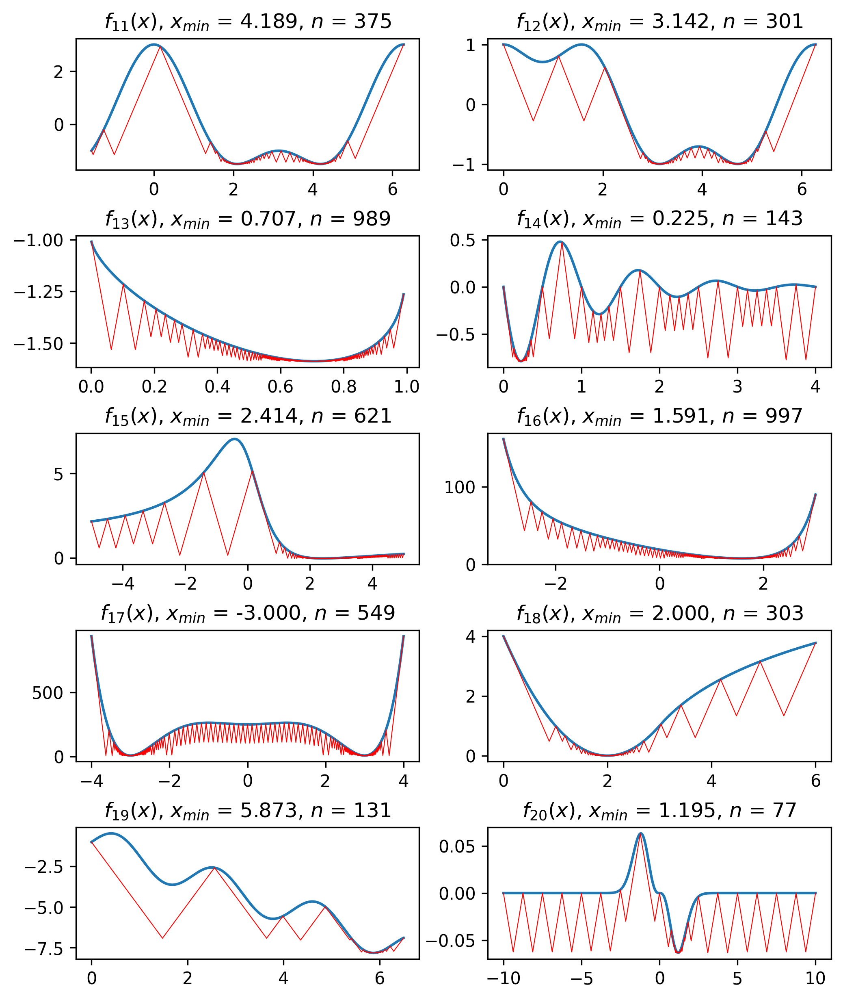

In [6]:
fig, _ = plot_test_functions(
    lambda tf: minimize_NA(f=tf.f, a=tf.interval[0], b=tf.interval[1], L=tf.L,
                           atol=1e-4*(tf.interval[1]-tf.interval[0]), full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Геометрический метод с глобальной константой Липшица

In [7]:
def minimize_NG(f, a, b, r, atol=None, maxfev=MAXFEV, full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум функции `f` с помощью геометрического
    метода с адаптивным оцениваением глобальной константы Липшица. Точность
    метода и максимальное количество вызовов функции задаются параметрами
    `atol` и `maxfev`, соответственно.
    """
    def new_point(i):
        return (x[i] + x[i + 1]) / 2 - (y[i + 1] - y[i]) / (2 * L)

    def characteristic(i):
        return (y[i] + y[i + 1]) / 2 - L * (x[i + 1] - x[i]) / 2

    def difference(i):
        return abs(y[i + 1] - y[i]) / (x[i + 1] - x[i])

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]                     # границы интервалов
    y = [f(a), f(b)]               # значения функции в x
    diff = [difference(0)]         # абсолютные приращения

    # начальная оценка константы Липшица
    H = diff[0]
    L = 1 if H < 1e-7 else H * r
    F = [characteristic(0)]

    while True:
        # выбор подынтервала
        i = argmin(F)

        # условия остановки
        if x[i + 1] - x[i] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # новое испытание
        x_new = new_point(i)
        x.insert(i + 1, x_new)
        y.insert(i + 1, f(x_new))
        diff[i] = difference(i)
        diff.insert(i + 1, difference(i + 1))

        # оценка глобальной константы Липшица
        k = i if diff[i] > diff[i + 1] else i + 1
        if diff[k] > H:  # обновляем все значения F
            H = diff[k]
            L = 1 if H < 1e-7 else H * r
            F = [characteristic(i) for i in range(len(y) - 1)]
        else:  # обновляем F только на новых интервалах
            F[i] = characteristic(i)
            F.insert(i + 1, characteristic(i + 1))

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    x_full = []
    y_full = []
    for i in range(len(x) - 1):
        x_full.append(x[i])
        x_full.append(new_point(i))
        y_full.append(y[i])
        y_full.append(characteristic(i))
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

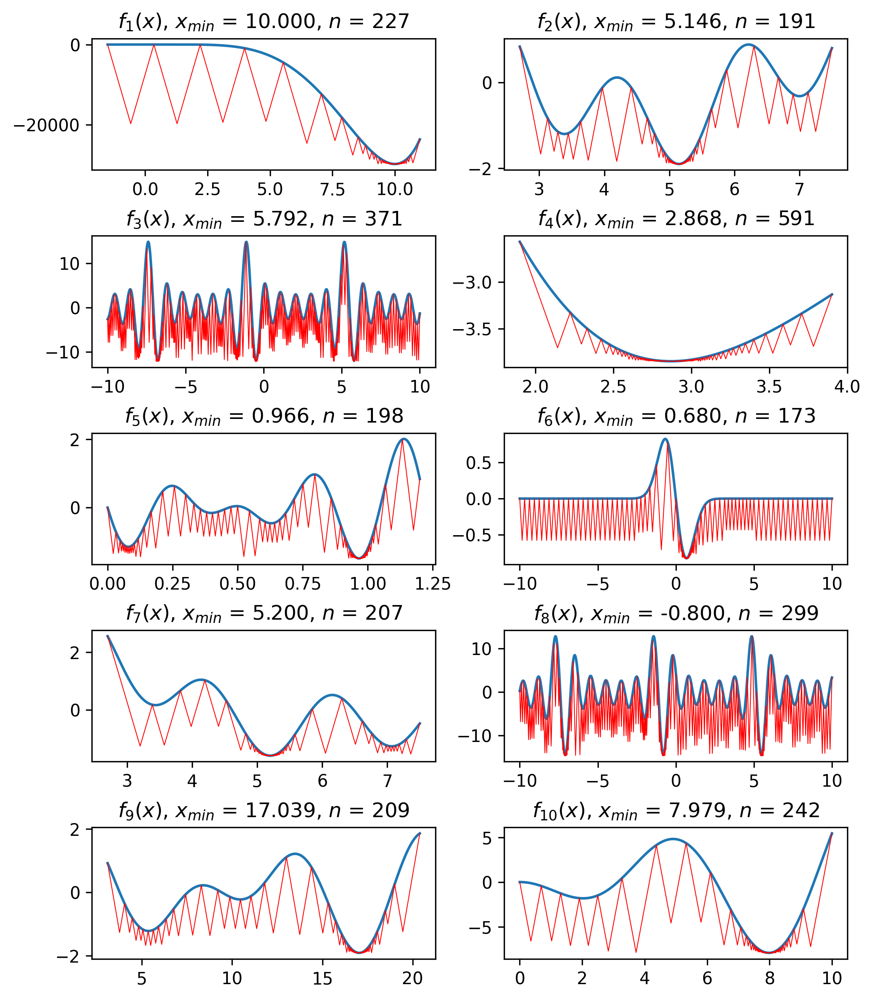

In [8]:
fig, _ = plot_test_functions(
    lambda tf: minimize_NG(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                           r=2, atol=1e-4*(tf.interval[1]-tf.interval[0]),
                           full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

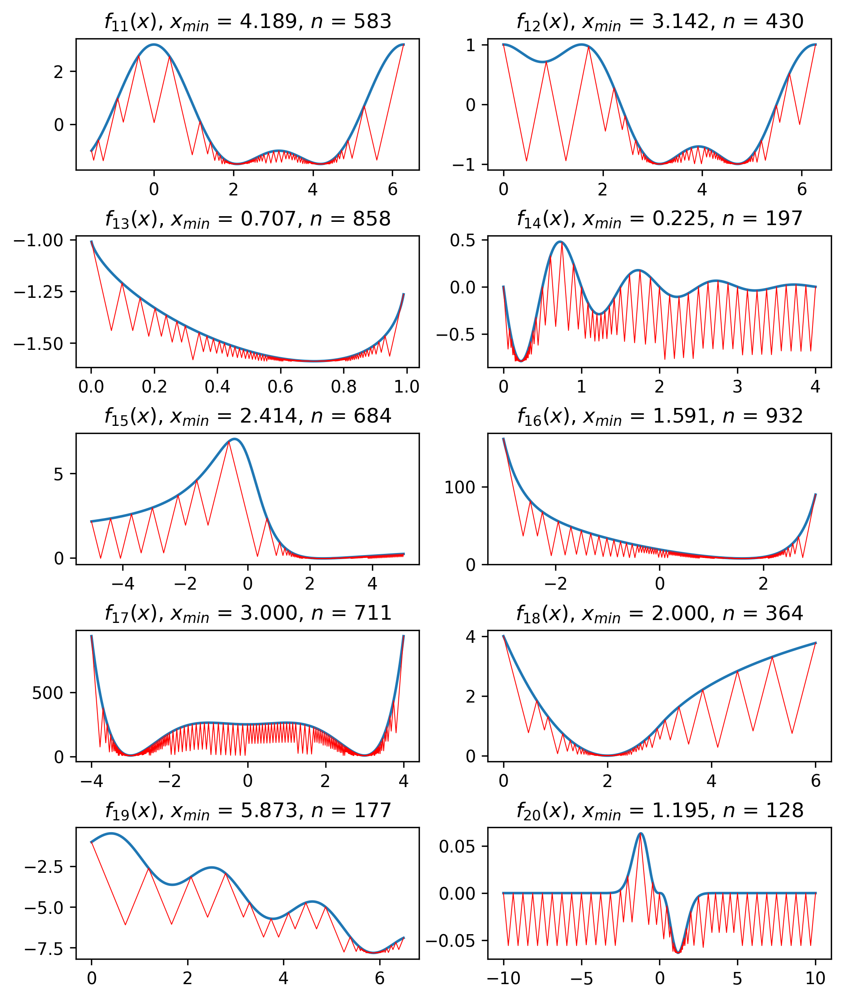

In [9]:
fig, _ = plot_test_functions(
    lambda tf: minimize_NG(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                           r=2, atol=1e-4*(tf.interval[1]-tf.interval[0]),
                           full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Информационно-статистический метод с глобальной константой Липшица

In [10]:
def minimize_ING(f, a, b, r, atol=None, maxfev=MAXFEV, full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум функции `f` с помощью информационно-
    статистического метода с адаптивным оцениваением глобальной константы
    Липшица. Точность метода и максимальное количество вызовов функции задаются
    параметрами `atol` и `maxfev`, соответственно.
    """
    def characteristic(i):
        return (mu * (x[i + 1] - x[i])
                + ((y[i + 1] - y[i])**2) / (mu * (x[i + 1] - x[i]))
                - 2 * (y[i + 1] + y[i]))

    def difference(i):
        return abs(y[i + 1] - y[i]) / (x[i + 1] - x[i])

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]
    diff = [difference(0)]

    # начальная оценка глобальной константы Липшица
    H = diff[0]
    mu = 1 if H < 1e-7 else H * r
    R = [characteristic(0)]

    while True:
        # выбор подынтервала
        i = argmax(R)

        # условия остановки
        if x[i + 1] - x[i] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # новое испытание
        x_new = (x[i] + x[i + 1]) / 2 - (y[i + 1] - y[i]) / (2 * mu)
        x.insert(i + 1, x_new)
        y.insert(i + 1, f(x_new))
        diff[i] = difference(i)
        diff.insert(i + 1, difference(i + 1))

        # оценка глобальной константы Липшица
        k = i if diff[i] > diff[i + 1] else i + 1
        if diff[k] > H:  # обновляем все значения R
            H = diff[k]
            mu = 1 if H < 1e-7 else H * r
            R = [characteristic(i) for i in range(len(y) - 1)]
        else:  # обновляем R только на новых интервалах
            R[i] = characteristic(i)
            R.insert(i + 1, characteristic(i + 1))

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    x_full = []
    y_full = []
    for i in range(len(x) - 1):
        x_full.append(x[i])
        x_full.append((x[i] + x[i + 1]) / 2 - (y[i + 1] - y[i]) / (2 * mu))
        y_full.append(y[i])
        y_full.append(y_full[-1] - mu * (x_full[-1] - x_full[-2]))
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

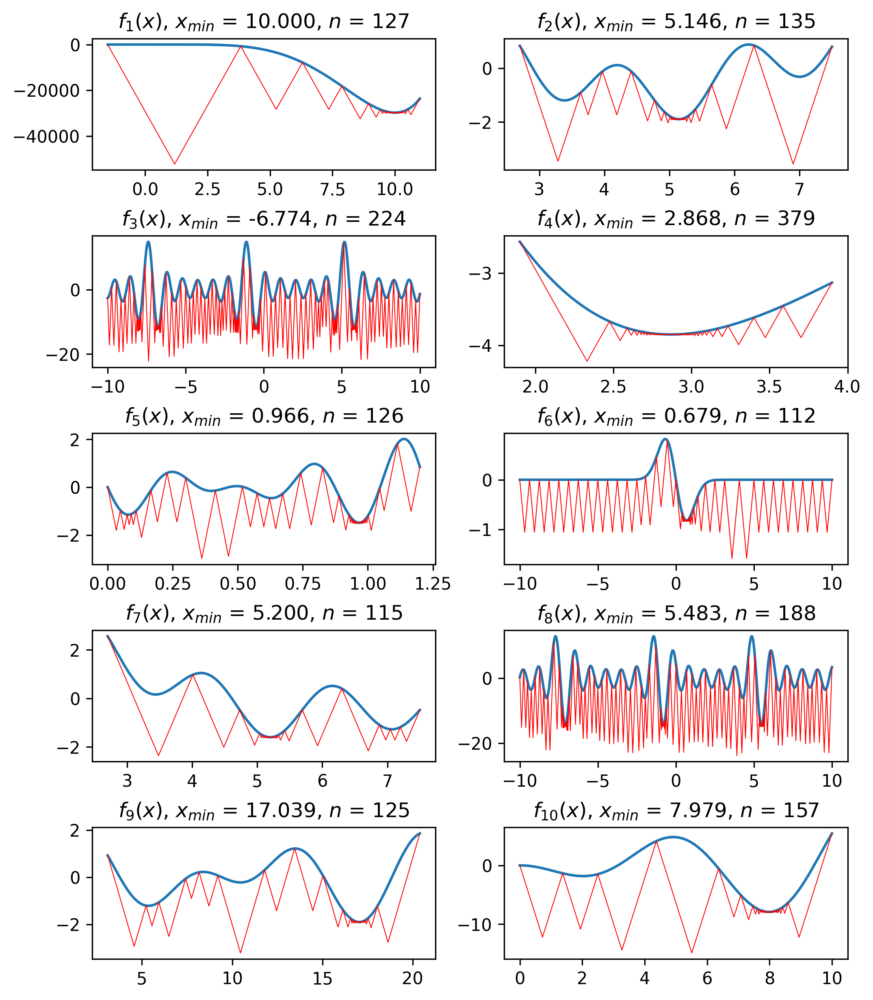

In [11]:
fig, _ = plot_test_functions(
    lambda tf: minimize_ING(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                            r=2, atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

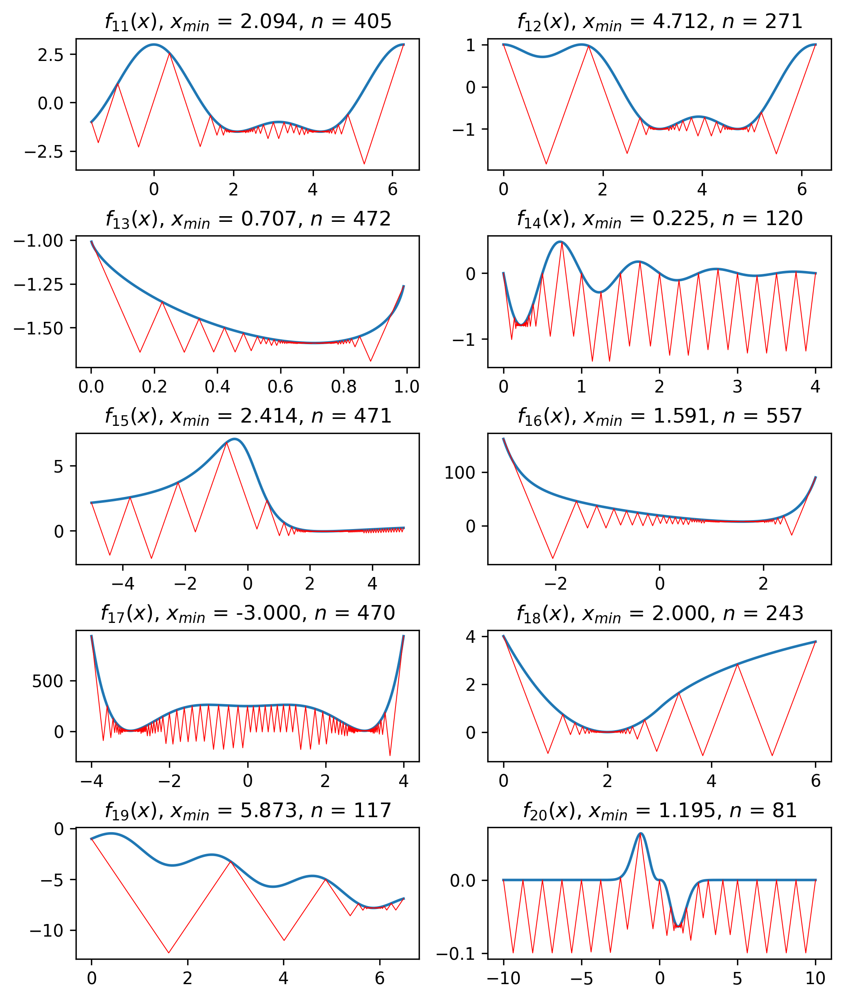

In [12]:
fig, _ = plot_test_functions(
    lambda tf: minimize_ING(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                            r=2, atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Информационно-статистический метод с глобальной константой Липшица (алтернативная версия)

In [13]:
def minimize_ING2(f, a, b, r, atol=None, maxfev=MAXFEV, full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум функции `f` с помощью информационно-
    статистического метода с адаптивным оцениваением глобальной константы
    Липшица. Точность метода и максимальное количество вызовов функции задаются
    параметрами `atol` и `maxfev`, соответственно.
    """
    def characteristic(i):
        return -4 * ((y[i] + y[i + 1]) / 2 - L * (x[i + 1] - x[i]) / 2)

    def difference(i):
        return abs(y[i + 1] - y[i]) / (x[i + 1] - x[i])

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]
    diff = [difference(0)]

    # начальная оценка глобальной константы Липшица
    H = diff[0]
    mu = 1 if H < 1e-7 else H * r
    L = 0.5 * (mu + 1 / mu * ((y[1] - y[0]) / (b - a))**2)
    R = [characteristic(0)]

    while True:
        # выбор подынтервала
        i = argmax(R)

        # условия остановки
        if x[i + 1] - x[i] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # новое испытание
        x_new = (x[i] + x[i + 1]) / 2 - (y[i + 1] - y[i]) / (2 * L)
        x.insert(i + 1, x_new)
        y.insert(i + 1, f(x_new))
        diff[i] = difference(i)
        diff.insert(i + 1, difference(i + 1))

        # оценка глобальной константы Липшица
        k = i if diff[i] > diff[i + 1] else i + 1
        if diff[k] > H:  # обновляем все значения R
            H = diff[k]
            mu = 1 if H < 1e-7 else H * r
            L = 0.5 * (mu
                       + 1 / mu * ((y[k + 1] - y[k]) / (x[k + 1] - x[k]))**2)
            R = [characteristic(i) for i in range(len(y) - 1)]
        else:  # обновляем R только на новых интервалах
            R[i] = characteristic(i)
            R.insert(i + 1, characteristic(i + 1))

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    x_full = []
    y_full = []
    for i in range(len(x) - 1):
        x_full.append(x[i])
        x_full.append((x[i] + x[i + 1]) / 2 - (y[i + 1] - y[i]) / (2 * mu))
        y_full.append(y[i])
        y_full.append(y_full[-1] - mu * (x_full[-1] - x_full[-2]))
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

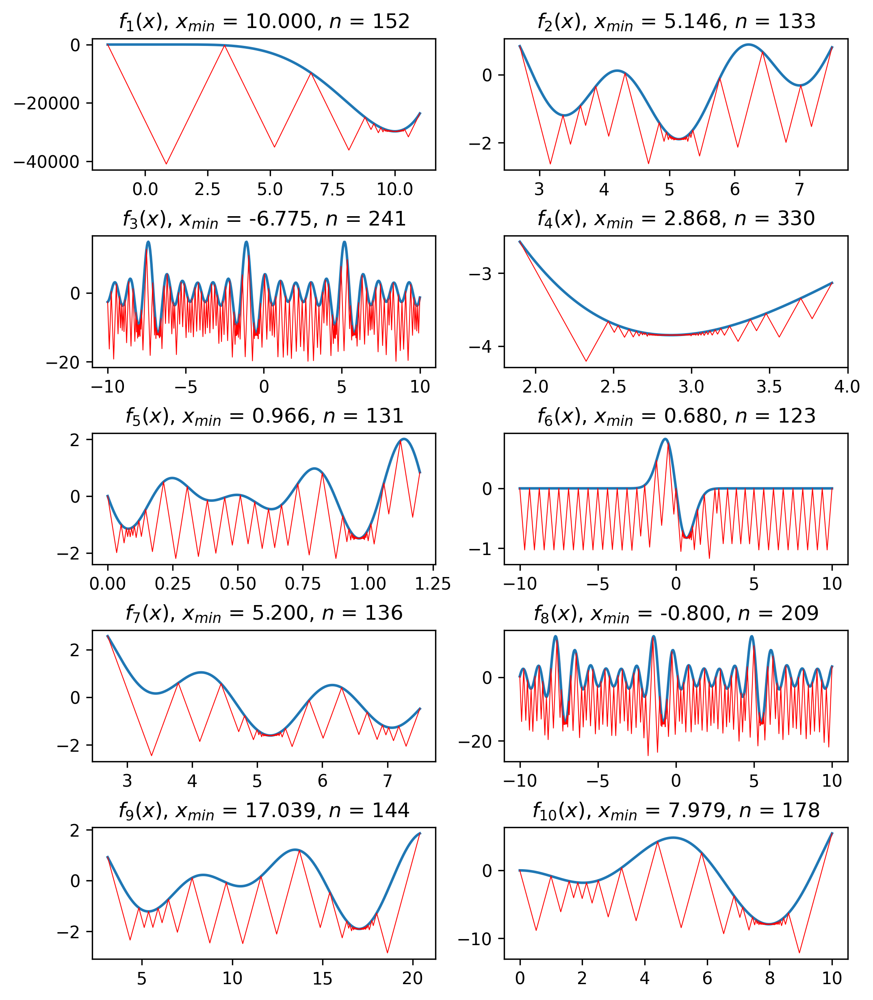

In [14]:
fig, _ = plot_test_functions(
    lambda tf: minimize_ING2(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                             r=2, atol=1e-4*(tf.interval[1]-tf.interval[0]),
                             full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

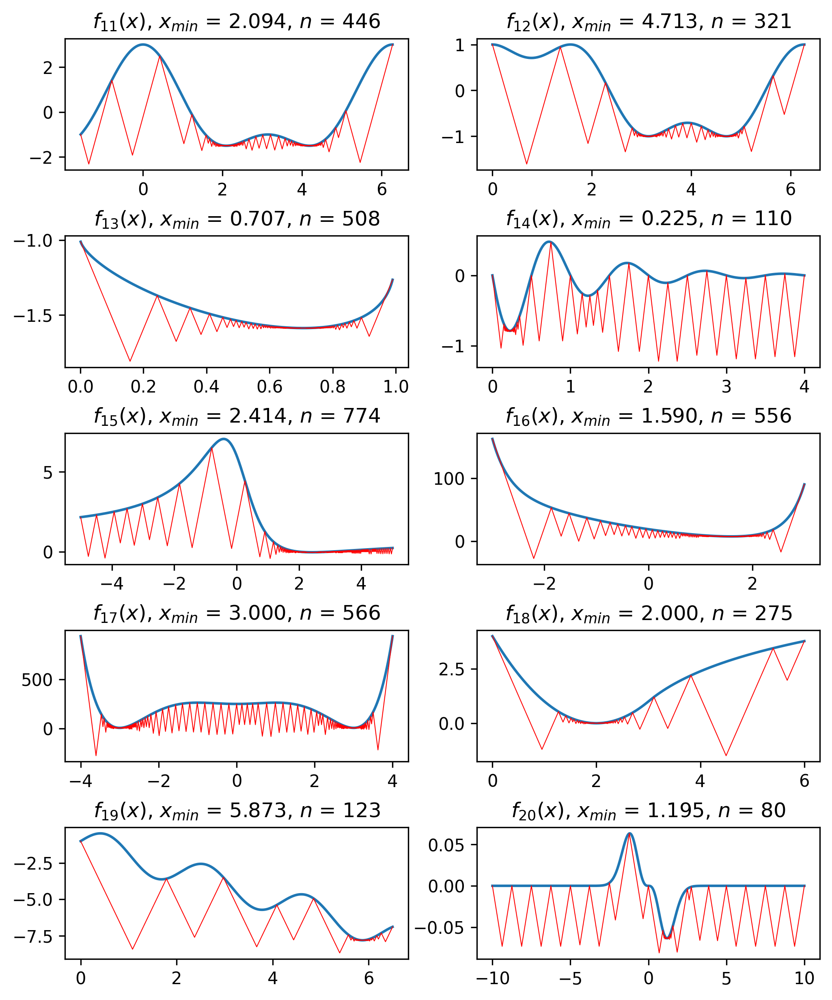

In [15]:
fig, _ = plot_test_functions(
    lambda tf: minimize_ING2(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                             r=2, atol=1e-4*(tf.interval[1]-tf.interval[0]),
                             full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Геометрический метод с локальными константами Липшица

In [16]:
def minimize_NL(f, a, b, r, xi, atol=None, maxfev=MAXFEV, full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум функции `f` с помощью геометрического
    метода с адаптивым оцениваением локальных констант Липшица. Точность метода
    и максимальное количество вызовов функции задаются параметрами `atol` и
    `maxfev`, соответственно.
    """
    def new_point(i):
        return (x[i + 1] + x[i]) / 2 - (y[i + 1] - y[i]) / (2 * mu[i])

    def characteristic(i):
        return (y[i + 1] + y[i]) / 2 - mu[i] * (x[i + 1] - x[i]) / 2

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]

    # оценка локальной константы Липшица и характеристики первого интервала
    dx = [b - a]
    diff = [abs(y[1] - y[0]) / dx[0]]
    X_max = dx[0]
    lam = [diff[0]]
    lam_max = lam[0]
    gamma = [lam_max * dx[0] / X_max]
    mu = [r * max(lam[0], gamma[0], xi)]
    R = [characteristic(0)]

    while True:
        # выбор подынтервала
        i = argmin(R)

        # условия остановки
        if x[i + 1] - x[i] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # новое испытание
        x.insert(i + 1, new_point(i))
        y.insert(i + 1, f(x[i + 1]))

        # оценка локальных констант Липшица и характеристик
        full_update = False  # обновлять ли все значения
        if dx[i] == X_max:   # разбиваем самый длинный интервал
            X_max = None
            full_update = True
        dx[i] = x[i + 1] - x[i]
        dx.insert(i + 1, x[i + 2] - x[i + 1])
        k = i if dx[i] > dx[i + 1] else i + 1
        if X_max is None:
            X_max = max(dx)
        elif dx[k] > X_max:
            X_max = dx[k]
            full_update = True

        # обновляем lam
        diff[i] = abs(y[i + 1] - y[i]) / dx[i]
        diff.insert(i + 1, abs(y[i + 2] - y[i + 1]) / dx[i + 1])
        lam.insert(i + 1, None)
        for j in range(max(0, i - 1), min(i + 3, len(lam))):
            j1 = max(0, j - 1)
            j2 = min(j + 2, len(lam))
            lam[j] = max(diff[j1:j2])
            if lam[j] > lam_max:
                lam_max = lam[j]
                full_update = True

        if full_update:  # обновить все значения
            gamma = [lam_max * dx_i / X_max for dx_i in dx]
            mu = [r * max(lam[i], gamma[i], xi) for i in range(len(lam))]
            R = [characteristic(i) for i in range(len(y) - 1)]
        else:  # обновить только значения, измененные новыми интервалами
            gamma.insert(i + 1, None)
            mu.insert(i + 1, None)
            R.insert(i + 1, None)
            for j in range(max(0, i - 1), min(i + 3, len(lam))):
                gamma[j] = lam_max * dx[j] / X_max
                mu[j] = r * max(lam[j], gamma[j], xi)
                R[j] = characteristic(j)

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    x_full = []
    y_full = []
    for i in range(len(x) - 1):
        x_full.append(x[i])
        y_full.append(y[i])
        x_full.append(new_point(i))
        y_full.append(characteristic(i))
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

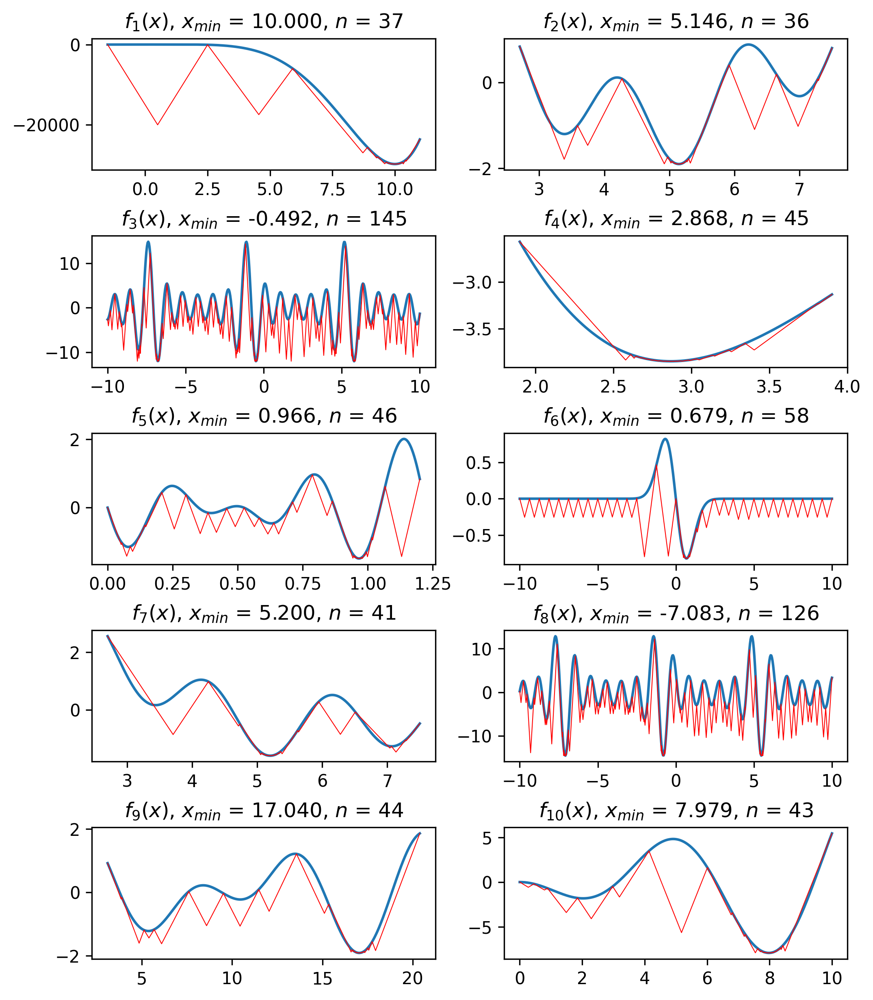

In [17]:
fig, _ = plot_test_functions(
    lambda tf: minimize_NL(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                           r=1.1, xi=1e-6,
                           atol=1e-4*(tf.interval[1]-tf.interval[0]),
                           full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

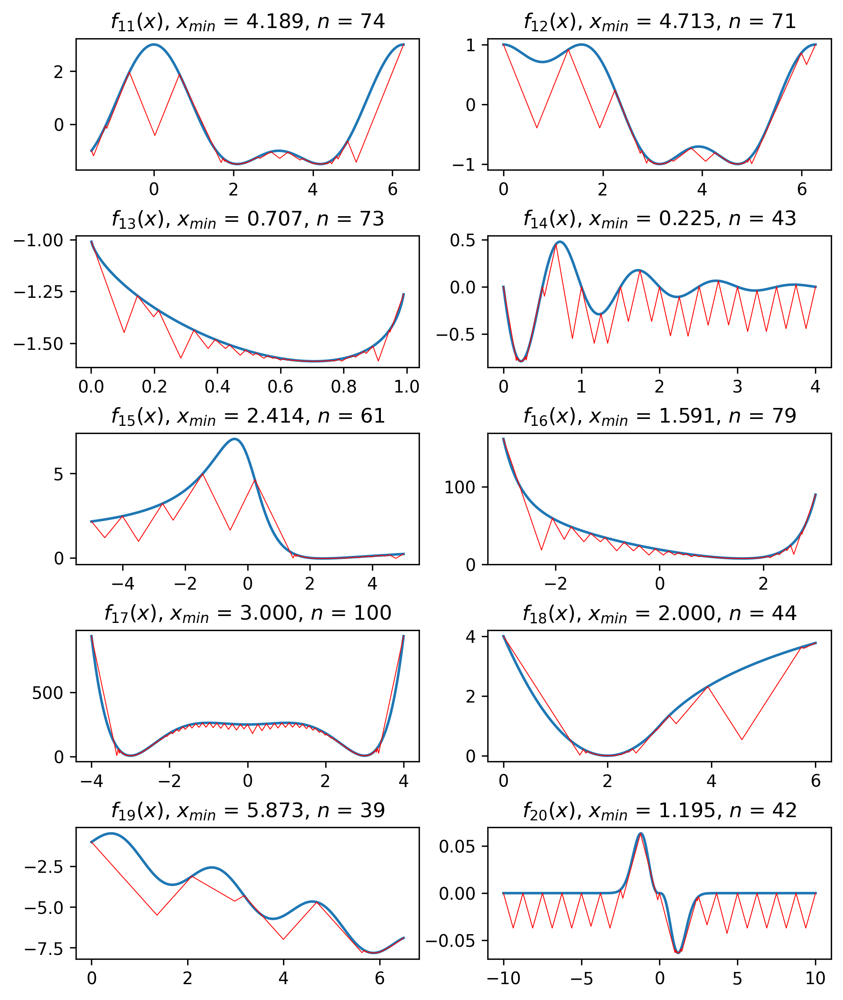

In [18]:
fig, _ = plot_test_functions(
    lambda tf: minimize_NL(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                           r=1.1, xi=1e-6,
                           atol=1e-4*(tf.interval[1]-tf.interval[0]),
                           full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Информационно-статистический метод с локальными константами Липшица

In [19]:
def minimize_INL(f, a, b, r, xi, atol=None, maxfev=MAXFEV, full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум функции `f` с помощью информационно-
    статистического метода с адаптивным оцениваением локальной константы
    Липшица. Точность метода и максимальное количество вызовов функции задаются
    параметрами `atol` и `maxfev`, соответственно.
    """
    def characteristic(i):
        return (mu[i] * dx[i] + (y[i + 1] - y[i])**2 / (dx[i] * mu[i])
                - 2 * (y[i + 1] + y[i]))

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]

    # оценка локальной константы Липшица и характеристики первого интервала
    dx = [b - a]
    X_max = dx[0]
    diff = [abs(y[1] - y[0]) / dx[0]]
    diff_max = diff[0]
    lam = [diff[0]]
    gamma = [diff_max]
    mu = [r * max(lam[0], gamma[0], xi)]
    R = [characteristic(0)]

    while True:
        # выбор подынтервала
        i = argmax(R)

        # условия остановки
        if x[i + 1] - x[i] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # новое испытание
        x_new = 0.5 * (x[i + 1] + x[i] - (y[i + 1] - y[i]) / mu[i])
        x.insert(i + 1, x_new)
        y.insert(i + 1, f(x_new))

        # оценка локальных констант Липшица и характеристик
        full_update = False  # обновлять ли все значения

        # обновляем dx
        if dx[i] == X_max:
            X_max = None
            full_update = True
        dx[i] = x[i + 1] - x[i]
        dx.insert(i + 1, x[i + 2] - x[i + 1])
        k = i if dx[i] > dx[i + 1] else i + 1
        if X_max is None:
            X_max = max(dx)
        elif dx[k] > X_max:
            X_max = dx[k]
            full_update = True

        # обновляем diff
        if diff[i] == diff_max:
            full_update = True
            diff_max = None
        diff[i] = abs(y[i + 1] - y[i]) / dx[i]
        diff.insert(i + 1, abs(y[i + 2] - y[i + 1]) / dx[i + 1])
        k = i if diff[i] > diff[i + 1] else i + 1
        if diff_max is None:
            diff_max = max(diff)
        elif diff[k] > diff_max:
            diff_max = diff[k]
            full_update = True

        # обновляем lam
        lam.insert(i + 1, None)
        for j in range(max(0, i - 1), min(i + 3, len(lam))):
            j1 = max(0, j - 1)
            j2 = min(j + 2, len(lam))
            lam[j] = max(diff[j1:j2])

        if full_update:  # обновить все значения
            gamma = [diff_max * dx_i / X_max for dx_i in dx]
            mu = [r * max(lam[i], gamma[i], xi) for i in range(len(lam))]
            R = [characteristic(i) for i in range(len(y) - 1)]
        else:  # обновить только значения, измененный новыми интервалами
            gamma.insert(i + 1, None)
            mu.insert(i + 1, None)
            R.insert(i + 1, None)
            for j in range(max(0, i - 1), min(i + 3, len(lam))):
                gamma[j] = diff_max * dx[j] / X_max
                mu[j] = r * max(lam[j], gamma[j], xi)
                R[j] = characteristic(j)

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    x_full = []
    y_full = []
    for i in range(len(x) - 1):
        x_full.append(x[i])
        x_full.append(0.5 * (x[i + 1] + x[i] - (y[i + 1] - y[i]) / mu[i]))
        y_full.append(y[i])
        y_full.append(y_full[-1] - mu[i] * (x_full[-1] - x_full[-2]))
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

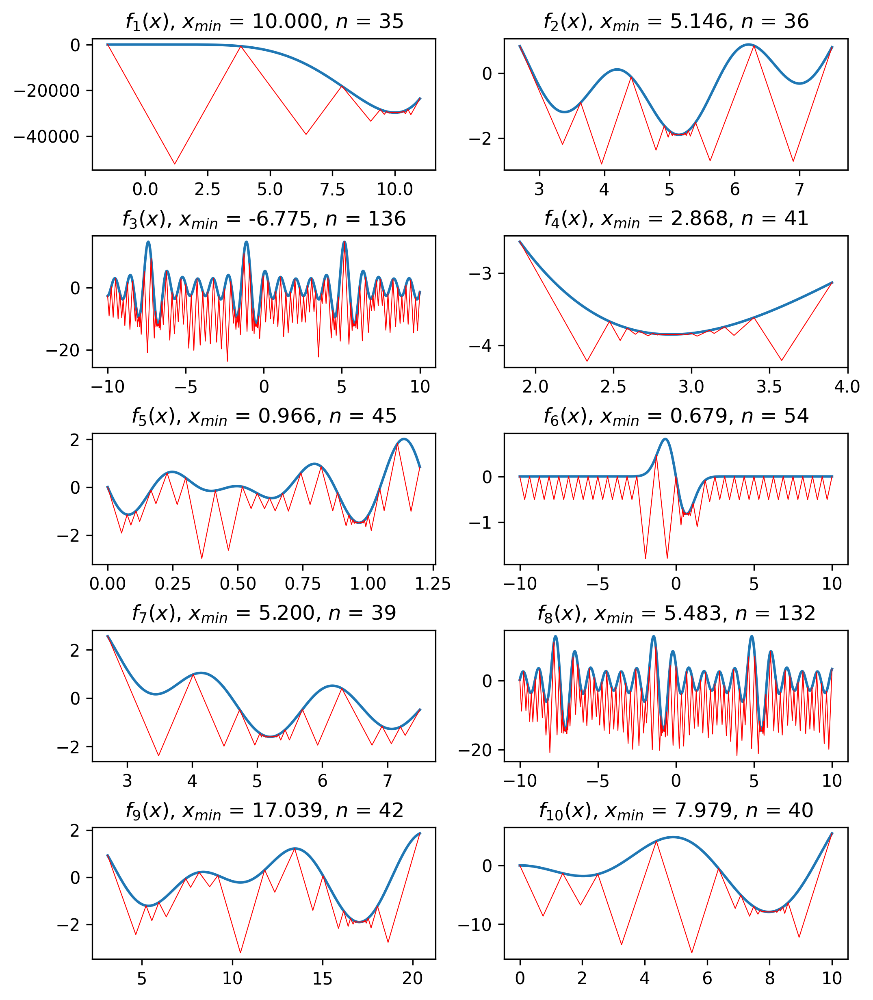

In [20]:
fig, _ = plot_test_functions(
    lambda tf: minimize_INL(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                            r=2, xi=1e-6,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

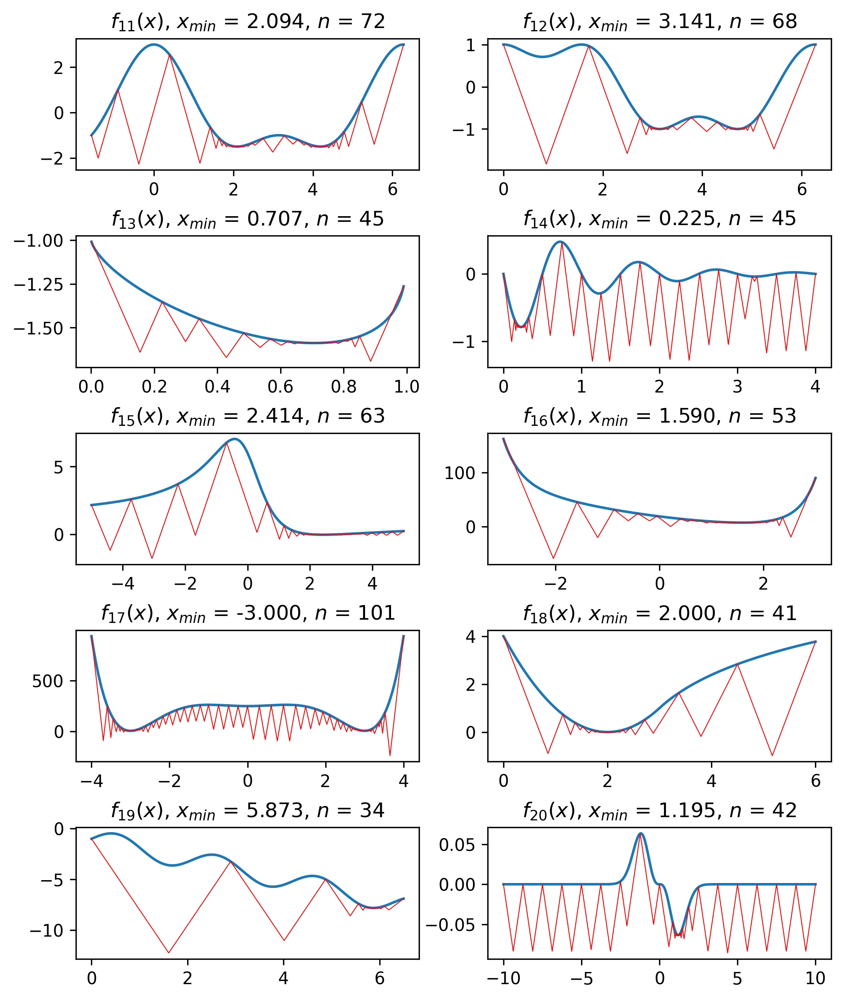

In [21]:
fig, _ = plot_test_functions(
    lambda tf: minimize_INL(f=tf.f, a=tf.interval[0], b=tf.interval[1],
                            r=2, xi=1e-6,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Метод с негладкими минорантами и глобальной оценкой константы Липшица производной

In [22]:
def minimize_DGN(f, fdot, a, b, r, atol=None, maxfev=MAXFEV,
                 full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум дифференцируемой функции `f` с помощью
    метода с адаптивным оцениваением глобальной константы Липшица. Точность
    метода и максимальное количество вызовов функции задаются параметрами
    `atol` и `maxfev`, соответственно.
    """
    def calculate_m(i):
        dx = x[i + 1] - x[i]
        alpha = abs(y_dot[i + 1] - y_dot[i]) / dx
        beta = 2 * (-y[i + 1] + y[i] + y_dot[i] * dx) / dx**2
        gamma = 2 * (y[i + 1] - y[i] - y_dot[i + 1] * dx) / dx**2
        return max(alpha, beta, gamma)

    def new_point(i):
        return ((-y[i + 1] + y[i] + y_dot[i + 1] * x[i + 1] - y_dot[i] * x[i]
                 + 0.5 * L * (x[i + 1]**2 - x[i]**2))
                / (L * (x[i + 1] - x[i]) + y_dot[i + 1] - y_dot[i]))

    def characteristic(i):
        x_hat = new_point(i)
        return y[i] + y_dot[i] * (x_hat - x[i]) - 0.5 * L * (x_hat - x[i])**2

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]
    y_dot = [fdot(a), fdot(b)]

    while True:
        # оценка константы Липшица для производной
        m = [calculate_m(i) for i in range(len(y) - 1)]
        G = max(m)
        L = 1 if G < 1e-7 else r * G

        # вычисление характеристик
        R = [characteristic(i) for i in range(len(y) - 1)]

        # выбор интервала для разбиения
        i = argmin(R)

        # условия остановки
        if x[i + 1] - x[i] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # новое испытание
        x.insert(i + 1, new_point(i))
        y.insert(i + 1, f(x[i + 1]))
        y_dot.insert(i + 1, fdot(x[i + 1]))

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    # возвращаем график миноранты
    x_hat = [new_point(i) for i in range(len(y) - 1)]
    x_full = []
    y_full = []
    for i in range(len(y) - 1):
        x_full.append(x[i])
        x_full.append(x_hat[i])
        y_full.append(y[i])
        y_full.append(R[i])
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

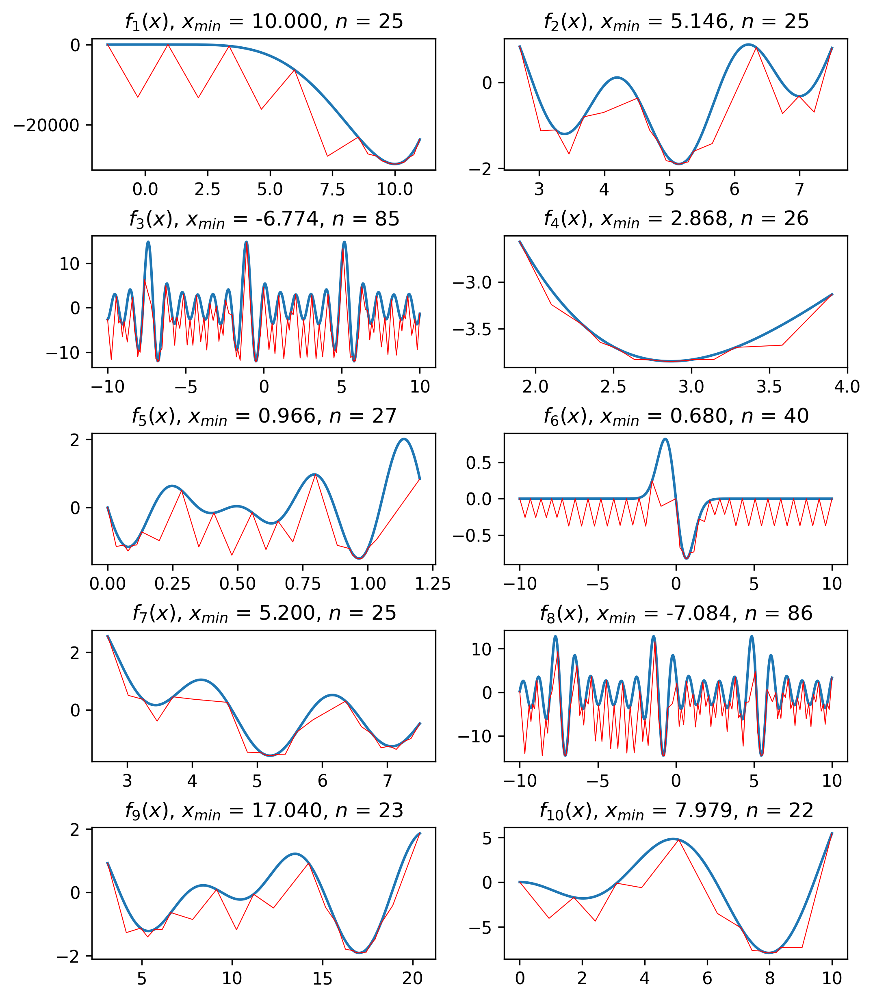

In [23]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DGN(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.1,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

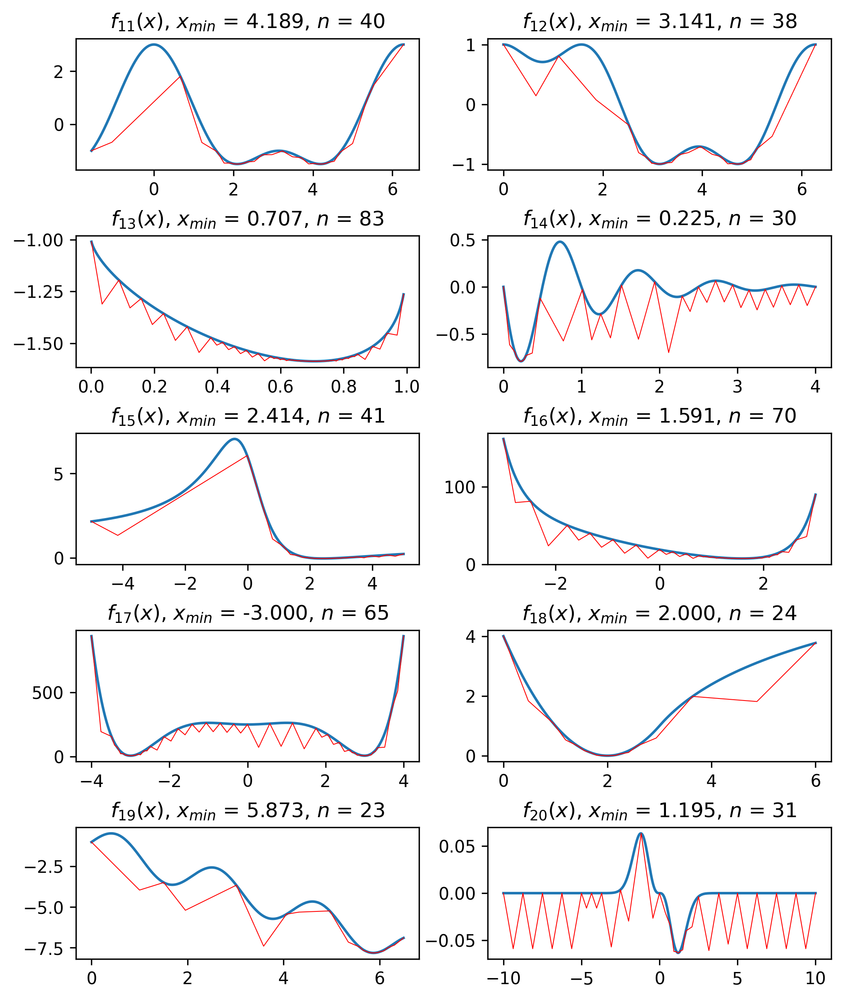

In [24]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DGN(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.1,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Метод с негладкими минорантами и локальными оценками констант Липшица производной

In [25]:
def minimize_DLN(f, fdot, a, b, r, xi, atol=None, maxfev=MAXFEV,
                 full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум дифференцируемой функции `f` с помощью
    метода с адаптивным оцениваением локальных констант Липшица. Точность
    метода и максимальное количество вызовов функции задаются параметрами
    `atol` и `maxfev`, соответственно.
    """
    def calculate_tau(i, pt):
        dx_f = pt - x[i]
        dx_b = pt - x[i + 1]
        return 2 * abs(y[i + 1] - y[i] + y_dot[i + 1] * dx_b
                       - y_dot[i] * dx_f) / (dx_b**2 + dx_f**2)

    def calculate_nu(i):
        if abs(y_dot[i] - y_dot[i + 1]) < 1e-6:
            return calculate_tau(i, (x[i] + x[i + 1]) / 2)
        d = 0.5 * np.sqrt(
            (2 * (y[i] - y[i + 1]) + (y_dot[i + 1] + y_dot[i]) * dx[i])**2
            + (y_dot[i + 1] - y_dot[i])**2 * dx[i]**2
            )
        d_minus = x[i] + ((y[i] - y[i + 1] + y_dot[i + 1] * dx[i] - d)
                          / (y_dot[i + 1] - y_dot[i]))
        if x[i] <= d_minus <= x[i + 1]:
            tau_minus = calculate_tau(i, d_minus)
        else:
            tau_minus = -np.inf
        d_plus = x[i] + ((y[i] - y[i + 1] + y_dot[i + 1] * dx[i] + d)
                         / (y_dot[i + 1] - y_dot[i]))
        if x[i] <= d_plus <= x[i + 1]:
            tau_plus = calculate_tau(i, d_plus)
        else:
            tau_plus = -np.inf
        return max(
            calculate_tau(i, x[i]),
            calculate_tau(i, x[i + 1]),
            tau_minus,
            tau_plus
        )

    def calculate_m(i):
        i1 = max(0, i - 1)
        i2 = min(len(nu), i + 2)
        lam = max(nu[i1:i2])
        gamma = max(nu) * dx[i] / max(dx)
        return r * max(lam, gamma, xi)

    def new_point(i):
        return ((-y[i + 1] + y[i] + y_dot[i + 1] * x[i + 1] - y_dot[i] * x[i]
                 + 0.5 * m[i] * (x[i + 1]**2 - x[i]**2))
                / (m[i] * dx[i] + y_dot[i + 1] - y_dot[i]))

    def characteristic(i):
        x_hat = new_point(i)
        return min(
            y[i],
            y[i + 1],
            y[i] + y_dot[i] * (x_hat - x[i]) - 0.5 * m[i] * (x_hat - x[i])**2
        )

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]
    dx = [b - a]
    y_dot = [fdot(a), fdot(b)]
    nu = [calculate_nu(0)]

    while True:
        # оценка локальных констант Липшица для производной
        m = [calculate_m(i) for i in range(len(y) - 1)]

        # вычисление характеристик
        R = [characteristic(i) for i in range(len(y) - 1)]

        # выбор интервала для разбиения
        i = argmin(R)

        # условия остановки
        if dx[i] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

        # новое испытание
        x.insert(i + 1, new_point(i))
        y.insert(i + 1, f(x[i + 1]))
        dx[i] = x[i + 1] - x[i]
        dx.insert(i + 1, x[i + 2] - x[i + 1])
        y_dot.insert(i + 1, fdot(x[i + 1]))
        nu = [calculate_nu(i) for i in range(len(y) - 1)]

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    # возвращаем график миноранты
    x_hat = [new_point(i) for i in range(len(y) - 1)]
    x_full = []
    y_full = []
    for i in range(len(y) - 1):
        x_full.append(x[i])
        x_full.append(x_hat[i])
        y_full.append(y[i])
        y_full.append(R[i])
    x_full.append(x[-1])
    y_full.append(y[-1])
    return OptimizeResult(x_min, x_full, y_full, len(y))

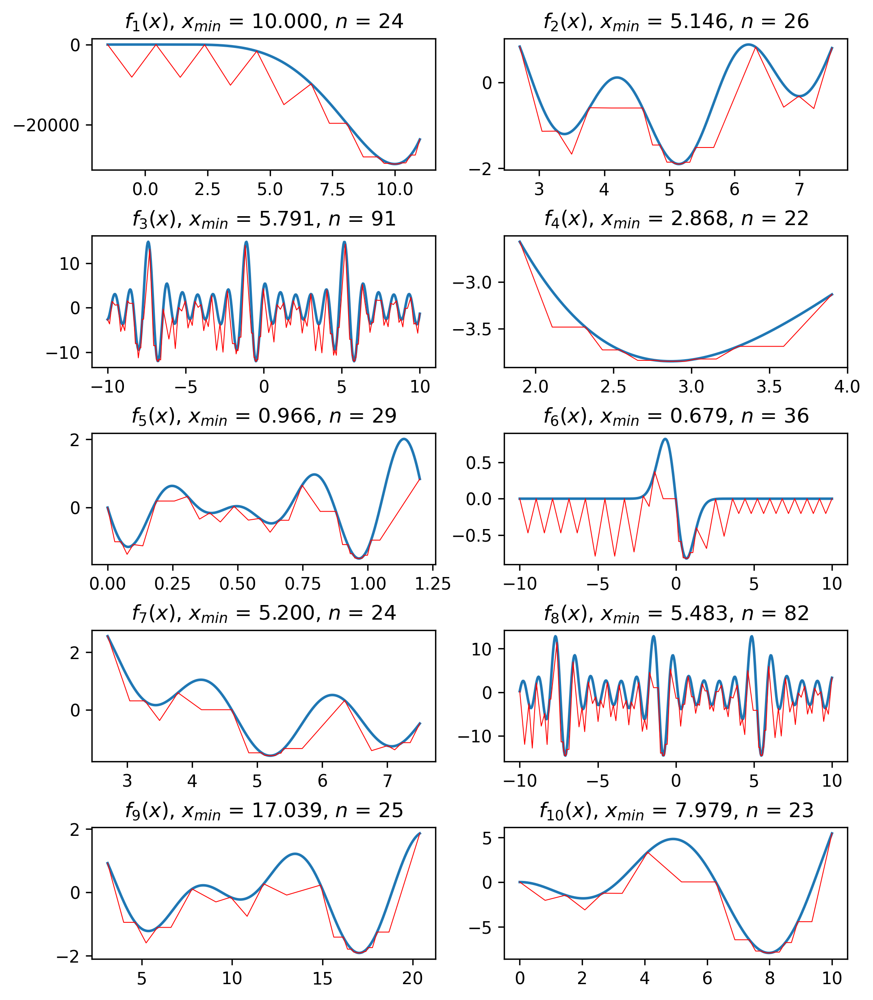

In [26]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DLN(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.1, xi=1e-9,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), True
)

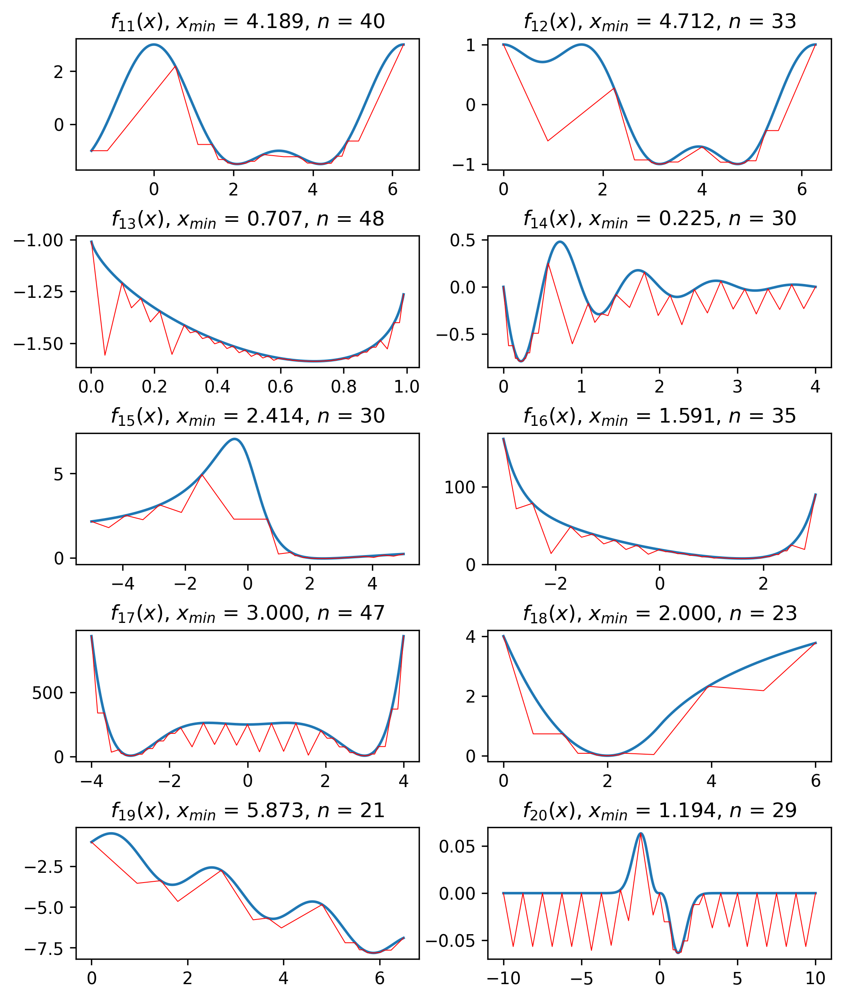

In [27]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DLN(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.1, xi=1e-9,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='-', lw=0.5, color='r'), False
)

# Метод с гладкими минорантами и глобальной оценкой константы Липшица производной

In [28]:
def minimize_DGS(f, fdot, a, b, r, xi, atol=None, maxfev=MAXFEV,
                 full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум дифференцируемой функции `f` с помощью
    метода с адаптивным оцениваением глобальной константы Липшица для
    производной, использующий гладкие миноранты. Точность метода и максимальное
    количество вызовов функции задаются параметрами `atol` и `maxfev`,
    соответственно.
    """
    def calculate_nu(i):
        d = np.sqrt((2 * (y[i] - y[i + 1])
                     + (y_dot[i + 1] + y_dot[i]) * dx[i])**2
                    + (y_dot[i + 1] - y_dot[i])**2 * dx[i]**2)
        return (abs(2 * (y[i] - y[i + 1])
                    + (y_dot[i + 1] + y_dot[i]) * dx[i]) + d) / dx[i]**2

    def calculate_pi(arg, m, b, c):
        return 0.5 * m * arg**2 + b * arg + c

    def calculate_pi_prime(arg, m, b):
        return m * arg + b

    def characteristic(i):
        # точки пересечения вспомогательных функций
        delta_1 = dx[i] / 4 + (y_dot[i + 1] - y_dot[i]) / (4 * m[i])
        delta_2 = ((y[i] - y[i + 1]
                    + y_dot[i + 1] * x[i + 1]
                    - y_dot[i] * x[i]
                    + 0.5 * m[i] * (x[i + 1]**2 - x[i]**2))
                   / (m[i] * dx[i] + y_dot[i + 1] - y_dot[i]))
        u[i] = delta_1 + delta_2
        u_prime[i] = -delta_1 + delta_2

        # ограничивающая парабола
        b = y_dot[i + 1] - 2 * m[i] * u[i] + m[i] * x[i + 1]
        c = (y[i + 1] - y_dot[i + 1] * x[i + 1]
             - 0.5 * m[i] * x[i + 1]**2 + m[i] * u[i]**2)
        piprime_u = calculate_pi_prime(u[i], m[i], b)
        piprime_uprime = calculate_pi_prime(u_prime[i], m[i], b)

        # характеристика зависит от положения минимума параболы
        if piprime_u * piprime_uprime < 0:
            x_hat[i] = 2 * u[i] - x[i + 1] - y_dot[i + 1] / m[i]
            psi = calculate_pi(x_hat[i], m[i], b, c)
            W.add(i)
            return min(y[i], psi, y[i + 1])
        else:
            if y[i] < y[i + 1]:
                U_prime.add(i)
                return y[i]
            U.add(i)
            return y[i + 1]

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]
    y_dot = [fdot(a), fdot(b)]
    dx = [b - a]

    while True:
        # оценка глобальной константы Липшица для производной
        nu = [calculate_nu(i) for i in range(len(y) - 1)]
        m = [r * max(xi, max(nu))] * (len(y) - 1)

        # вычисление характеристик
        W = set()
        U = set()
        U_prime = set()
        u = [None] * (len(y) - 1)
        u_prime = [None] * (len(y) - 1)
        x_hat = [None] * (len(y) - 1)
        R = [characteristic(i) for i in range(len(y) - 1)]
        # последняя комманда заполняет все инициализированные массивы

        # выбор интервала для разбиения
        t = argmin(R)

        # выбор точки для нового испытания
        if t in U_prime:
            x_new = u_prime[t]
        elif t in W:
            x_new = x_hat[t]
        else:
            assert t in U
            x_new = u[t]

        # новое испытание
        x.insert(t + 1, x_new)
        y.insert(t + 1, f(x[t + 1]))
        dx[t] = x[t + 1] - x[t]
        dx.insert(t + 1, x[t + 2] - x[t + 1])
        y_dot.insert(t + 1, fdot(x[t + 1]))

        # условия остановки
        if dx[t] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    return OptimizeResult(x_min, x, y, len(y))

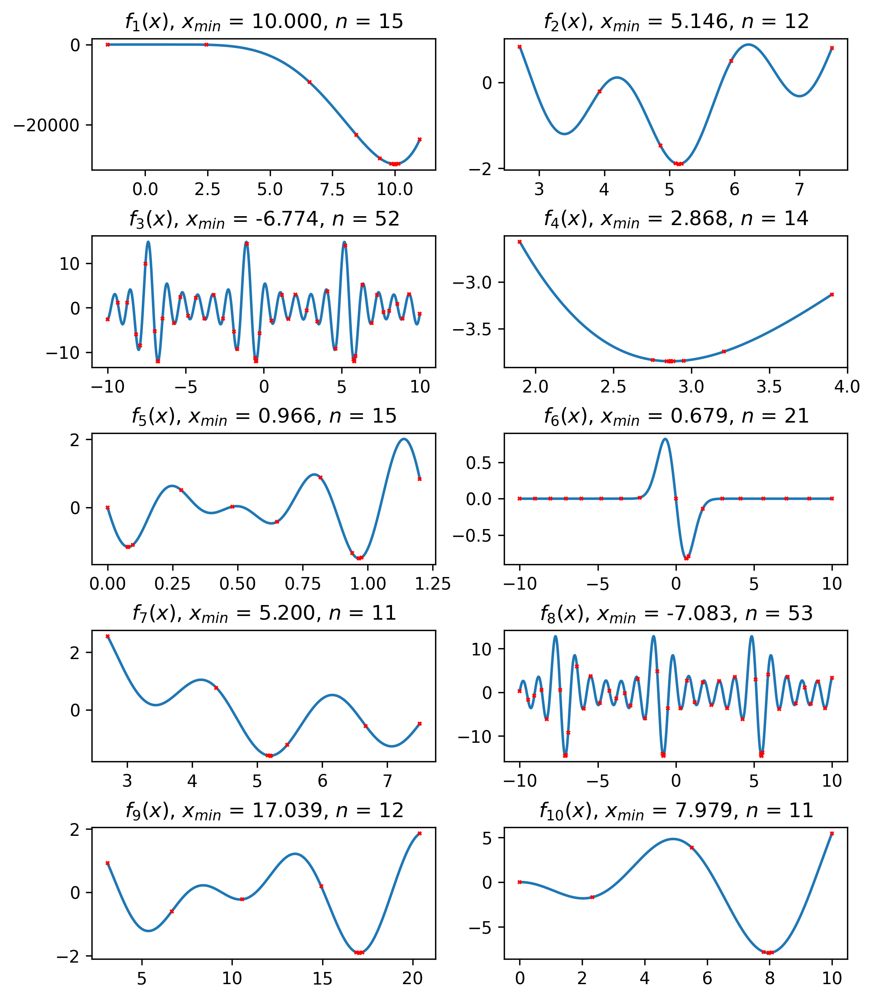

In [29]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DGS(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.11, xi=1e-9,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='none', marker='x', ms=2, color='r'), True
)

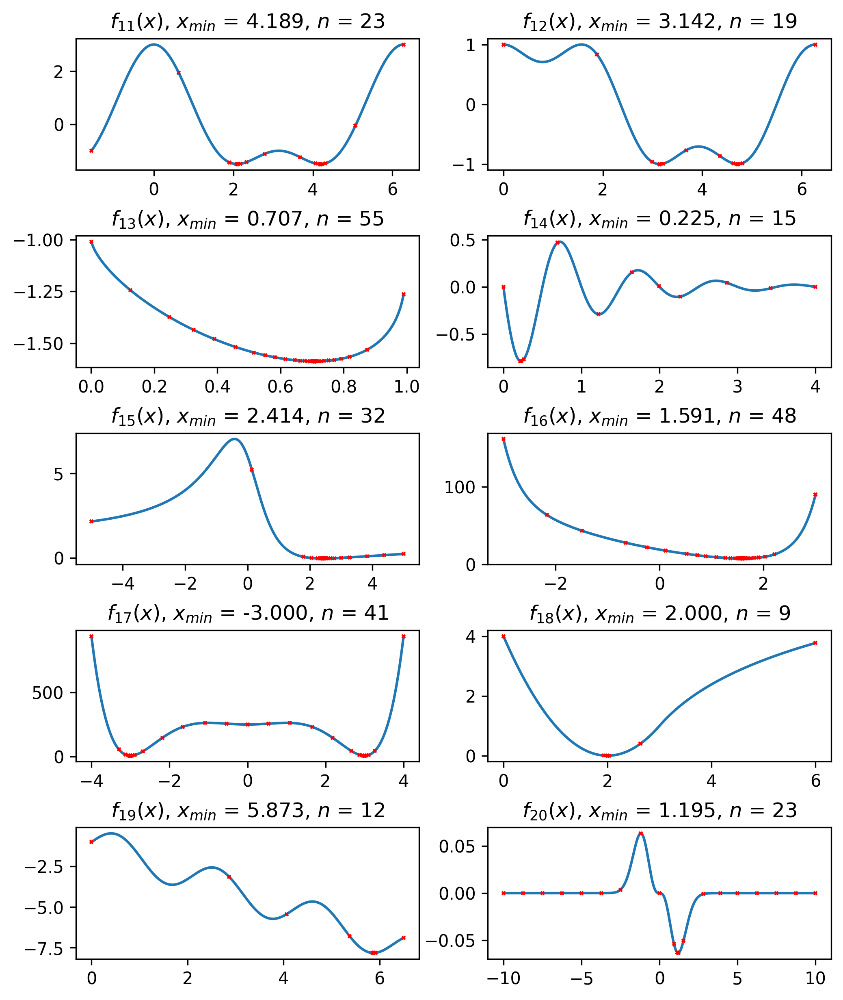

In [30]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DGS(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.11, xi=1e-9,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='none', marker='x', ms=2, color='r'), False
)

# Метод с гладкими минорантами и локальными оценками констант Липшица производной

In [31]:
def minimize_DLS(f, fdot, a, b, r, xi, atol=None, maxfev=MAXFEV,
                 full_output=False):
    """
    Найти на отрезке [`a`, `b`] минимум дифференцируемой функции `f` с помощью
    метода с адаптивным оцениваением локальных констант Липшица для
    производной, использующий гладкие миноранты. Точность метода и максимальное
    количество вызовов функции задаются параметрами `atol` и `maxfev`,
    соответственно.
    """
    def calculate_nu(i):
        d = np.sqrt((2 * (y[i] - y[i + 1])
                     + (y_dot[i + 1] + y_dot[i]) * dx[i])**2
                    + (y_dot[i + 1] - y_dot[i])**2 * dx[i]**2)
        return (abs(2 * (y[i] - y[i + 1])
                    + (y_dot[i + 1] + y_dot[i]) * dx[i]) + d) / dx[i]**2

    def calculate_pi(arg, m, b, c):
        return 0.5 * m * arg**2 + b * arg + c

    def calculate_pi_prime(arg, m, b):
        return m * arg + b

    def characteristic(i):
        # точки пересечения вспомогательных функций
        delta_1 = dx[i] / 4 + (y_dot[i + 1] - y_dot[i]) / (4 * m[i])
        delta_2 = ((y[i] - y[i + 1]
                    + y_dot[i + 1] * x[i + 1]
                    - y_dot[i] * x[i]
                    + 0.5 * m[i] * (x[i + 1]**2 - x[i]**2))
                   / (m[i] * dx[i] + y_dot[i + 1] - y_dot[i]))
        u[i] = delta_1 + delta_2
        u_prime[i] = -delta_1 + delta_2

        # ограничивающая парабола
        b = y_dot[i + 1] - 2 * m[i] * u[i] + m[i] * x[i + 1]
        c = (y[i + 1] - y_dot[i + 1] * x[i + 1]
             - 0.5 * m[i] * x[i + 1]**2 + m[i] * u[i]**2)
        piprime_u = calculate_pi_prime(u[i], m[i], b)
        piprime_uprime = calculate_pi_prime(u_prime[i], m[i], b)

        # характеристика зависит от положения минимума параболы
        if piprime_u * piprime_uprime < 0:
            x_hat[i] = 2 * u[i] - x[i + 1] - y_dot[i + 1] / m[i]
            psi = calculate_pi(x_hat[i], m[i], b, c)
            W.add(i)
            return min(y[i], psi, y[i + 1])
        else:
            if y[i] < y[i + 1]:
                U_prime.add(i)
                return y[i]
            U.add(i)
            return y[i + 1]

    # точность по умолчанию
    if atol is None:
        atol = (b - a) * 1e-4

    x = [a, b]
    y = [f(a), f(b)]
    y_dot = [fdot(a), fdot(b)]
    dx = [b - a]

    while True:
        # оценка глобальной константы Липшица для производной
        nu = [r * calculate_nu(i) for i in range(len(y) - 1)]
        lam = [None] * len(nu)
        for j in range(len(lam)):
            j1 = max(0, j - 1)
            j2 = min(len(lam), j + 2)
            lam[j] = max(nu[j1:j2])
        nu_max = max(nu)
        X_max = max(dx)
        gamma = [nu_max * dx_i / X_max for dx_i in dx]
        m = [max(lam[i], gamma[i], xi) for i in range(len(lam))]

        # вычисление характеристик
        W = set()
        U = set()
        U_prime = set()
        u = [None] * (len(y) - 1)
        u_prime = [None] * (len(y) - 1)
        x_hat = [None] * (len(y) - 1)
        R = [characteristic(i) for i in range(len(y) - 1)]
        # последняя комманда заполняет все инициализированные массивы

        # выбор интервала для разбиения
        t = argmin(R)

        # выбор точки для нового испытания
        if t in U_prime:
            x_new = u_prime[t]
        elif t in W:
            x_new = x_hat[t]
        else:
            assert t in U
            x_new = u[t]

        # новое испытание
        x.insert(t + 1, x_new)
        y.insert(t + 1, f(x[t + 1]))
        dx[t] = x[t + 1] - x[t]
        dx.insert(t + 1, x[t + 2] - x[t + 1])
        y_dot.insert(t + 1, fdot(x[t + 1]))

        # условия остановки
        if dx[t + 1] <= atol:
            break
        if len(y) >= maxfev:
            raise Exception(
                f'Решение не сошлось после {maxfev} вызовов целевой функции.')

    # найдём минимум
    x_min = x[argmin(y)]

    # возвращаем результат
    if not full_output:
        return x_min
    return OptimizeResult(x_min, x, y, len(y))

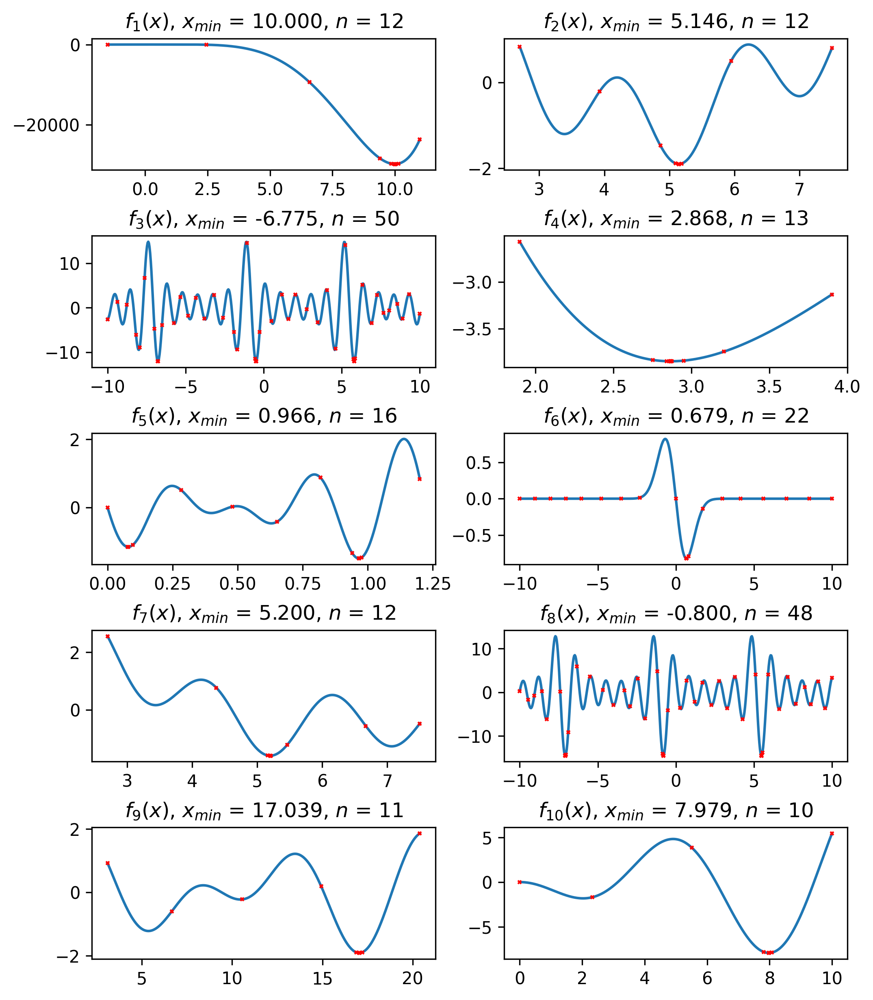

In [32]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DLS(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.11, xi=1e-9,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='none', marker='x', ms=2, color='r'), True
)

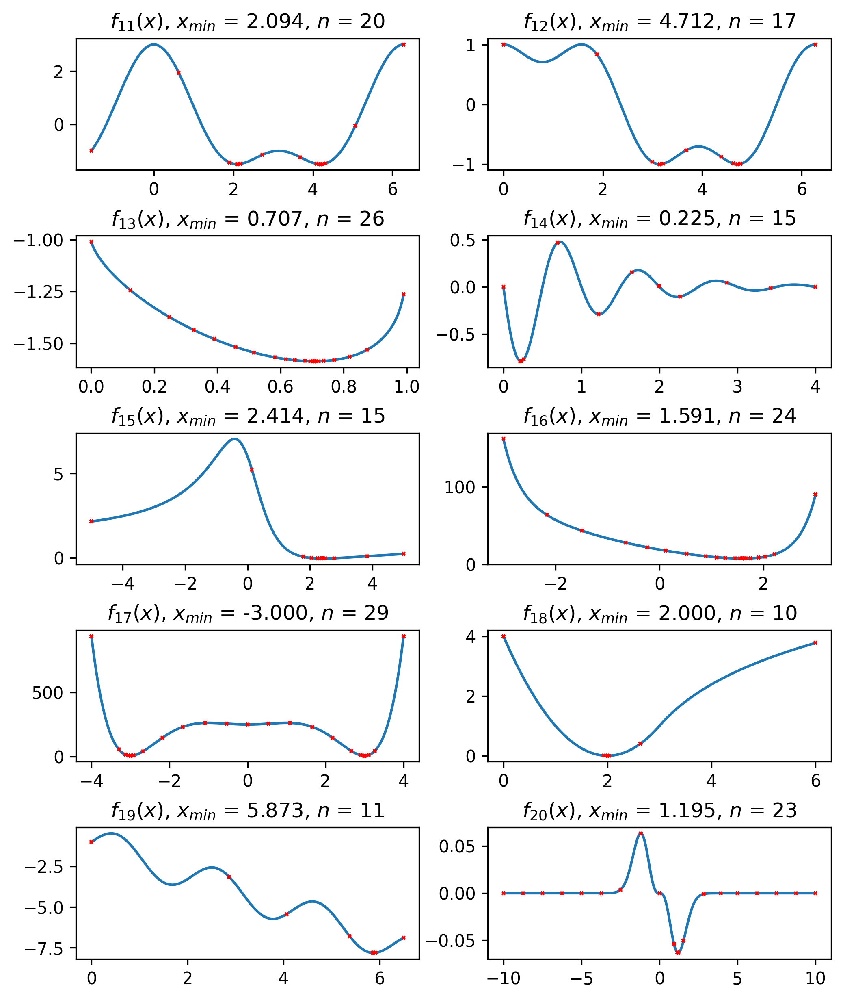

In [33]:
fig, _ = plot_test_functions(
    lambda tf: minimize_DLS(f=tf.f, fdot=tf.fdot, a=tf.interval[0],
                            b=tf.interval[1], r=1.11, xi=1e-9,
                            atol=1e-4*(tf.interval[1]-tf.interval[0]),
                            full_output=True),
    dict(ls='none', marker='x', ms=2, color='r'), False
)